# UQ Framework applied to the Darcy problem

In [1]:
import sys
from pathlib import Path
PROJECT_ROOT = Path.cwd().parents[1]  
sys.path.insert(0, str(PROJECT_ROOT))
project_root = Path("/home/philipp-felsen/Desktop/master-thesis-nice-karlsruhe")
sys.path.insert(0, str(project_root))
import numpy as np
import pandas as pd
from itertools import product
from tqdm import tqdm
from fem.darcyProblem import Darcy


from permeability.lognormalField import LognormalField
from permeability.lognormalInclusion import LognormalInclusion
from permeability.movingInclusion import LognormalMovingInclusion
from permeability.multiphase import MultiphaseField
from permeability.randomShapeField import RandomShapeField

from matplotlib.ticker import LogLocator, NullFormatter, MaxNLocator
import matplotlib.pyplot as plt

font_size=12
title_size=14
label_size=13
tick_size=11
legend_size=10
dpi=300


plt.rcParams.update({
    "figure.dpi": dpi,
    "savefig.dpi": dpi,
    "font.size": font_size,
    "axes.titlesize": title_size,
    "axes.labelsize": label_size,
    "xtick.labelsize": tick_size,
    "ytick.labelsize": tick_size,
    "legend.fontsize": legend_size,
    "figure.titlesize": title_size + 1,
    "lines.linewidth": 2.0,
    "lines.markersize": 6.0,
    "text.usetex": False
})


qoiNamesDarcy = [
    "Outflow",
    "Mean flux",
    "Mean pressure in box",
    "Pressure L²",
    "Flux L²"
]

qoi_latex = {
    "Outflow":
        r"$Q(\xi)=\int_{\Gamma_{\mathrm{out}}}"
        r" q(x,\xi)\cdot n\,ds$",

    "Mean flux":
        r"$Q(\xi)=\frac{1}{|D|}"
        r"\int_D \|q(x,\xi)\|\,dx$",

    "Mean pressure box":
        r"$Q(\xi)=\frac{1}{|D_b|}"
        r"\int_{D_b} p(x,\xi)\,dx$",

    "Pressure L²":
        r"$Q(\xi)=\|p(\cdot,\xi)\|_{L^2(D)}$",

    "Flux L²":
        r"$Q(\xi)=\|q(\cdot,\xi)\|_{L^2(D)}$",
}

# Fields

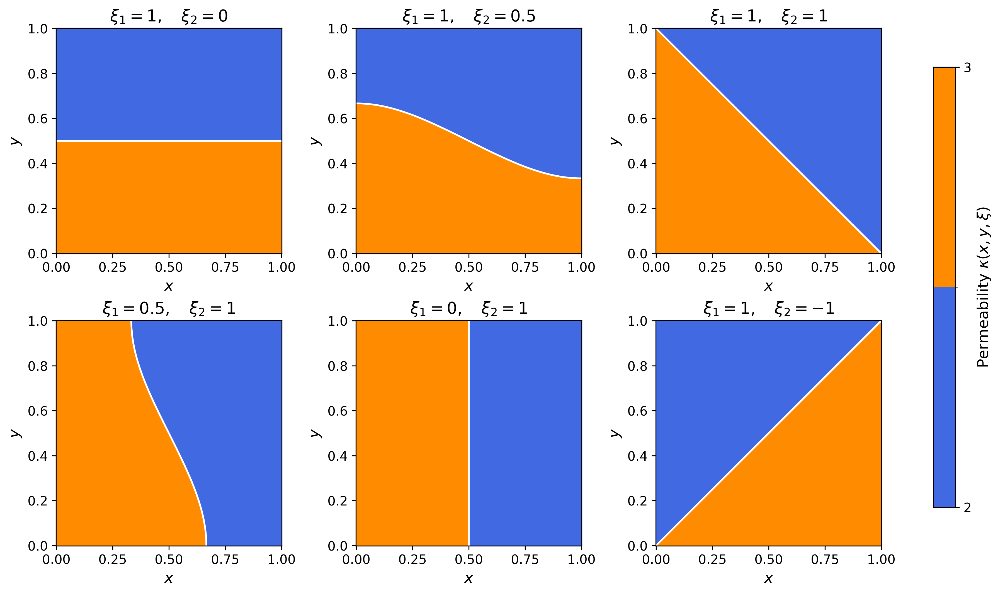

In [2]:
from matplotlib.colors import ListedColormap, BoundaryNorm

mu = 1.0
kappa_minus = 2.0
kappa_plus = 3.0

field = MultiphaseField(
    dim=2,
    numberOfPhases=2,
    mu=mu,
    phaseValues=[kappa_minus, kappa_plus],
    phaseBoundaries=[np.exp(mu)],
)

x = np.linspace(0.0, 1.0, 301)
y = np.linspace(0.0, 1.0, 301)
X, Y = np.meshgrid(x, y, indexing="xy")

xi_values = [
    (1.0,  0.0),
    (1.0,  0.5),
    (1.0,  1.0),  
    (0.5,  1.0),
    (0.0,  1.0),
    (1.0, -1.0),  
]

cmap = ListedColormap(["royalblue", "darkorange"])
norm = BoundaryNorm(
    [
        kappa_minus - 1e-12,
        0.5 * (kappa_minus + kappa_plus),
        kappa_plus + 1e-12,
    ],
    cmap.N,
)

fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(12, 7),
    constrained_layout=True,
)

for ax, (xi_1, xi_2) in zip(axes.flat, xi_values):
    xi = np.array([xi_1, xi_2])

    permeability = field.evaluate(X, Y, xi=xi)

    image = ax.pcolormesh(
        X,
        Y,
        permeability,
        cmap=cmap,
        norm=norm,
        shading="auto",
    )

    F = (
        xi_1 * np.cos(np.pi * Y)
        + xi_2 * np.cos(np.pi * X)
    )
    ax.contour(
        X,
        Y,
        F,
        levels=[0.0],
        colors="white",
        linewidths=1.5,
    )

    ax.set_title(rf"$\xi_1={xi_1:g},\quad \xi_2={xi_2:g}$")
    ax.set_xlabel(r"$x$")
    ax.set_ylabel(r"$y$")
    ax.set_aspect("equal")

fig.colorbar(
    image,
    ax=axes.ravel().tolist(),
    ticks=[kappa_minus, kappa_plus],
    label=r"Permeability $\kappa(x,y,\xi)$",
    shrink=0.85,
)


plt.show()

## QoIs over FEM

In [4]:
degrees = [1,2]
levels = [2,3,4,5,6,7]

stochDim = 15
mu = 1.0
sigma = 0.25
corrLength = 0.1
numberOfPhases = 2
phaseValues=[2,6]
inclusionValues=(2,3)
movingInclusionValue=3.0
fields = ["LognormalField","LognormalInclusion", "LognormalMovingInclusion", "MultiphaseField", "RandomShapeField"]
nFields = 50
seed = 1


def make_field(field_type):
    if field_type == "LognormalField":
        return LognormalField(
            dim=stochDim,
            corrLength=corrLength,
            mu=mu,
            sigma=sigma,
        )
    
    if field_type == "LognormalInclusion":
        return LognormalInclusion(
        dim=stochDim,
        corrLength=corrLength,
        mu=mu,
        sigma=sigma,
        inclusionValues=inclusionValues
    )

    if field_type == "LognormalMovingInclusion":
        return LognormalMovingInclusion(
        dim=stochDim,
        corrLength=corrLength,
        mu=mu,
        sigma=sigma,
        inclusionValue=movingInclusionValue,
        maxShift=(0.40, 0.40) # Can move anywhere inside the box
    )

    if field_type == "MultiphaseField":
        return MultiphaseField(
        dim=stochDim,
        numberOfPhases=numberOfPhases,
        phaseValues=phaseValues,
        phaseBoundaries=[np.exp(mu)],
        corrLength=corrLength,
        mu=mu,
        sigma=sigma
    )

    if field_type == "RandomShapeField":
        return RandomShapeField(
        dim=stochDim,
        inclusionValue=3.0,
        backgroundValue = 2.0,
        center=(0.5, 0.5),
        baseRadius=0.25,
        deformationStrength=0.5,
    )

def sampleXi(seed):
    rng = np.random.default_rng(seed)
    return rng.uniform(-1.0, 1.0, stochDim)

In [4]:
# Run
rows = []
total = (len(fields) * nFields * len(degrees) * len(levels))
iterator = product(fields, range(nFields), degrees, levels)

for field_type, field_id, degree, level in tqdm(iterator, total=total, desc="Running FEM Qoi"):
    seed = 10000 + 1000 * fields.index(field_type) + field_id

    field = make_field(field_type)
    xi = sampleXi(seed)
    field.setXi(xi)

    darcy = Darcy(
        permeabilityField=field,
        meshLevel=level,
        degree=degree,
        elementType="RT",
        darcySolver="mumps",
        darcyPrecon=None,
        pTop=1.0,
        pBottom=0.0,
        plotSolution=False,
        femDarcyVerbose=False,
        linearSolverVerbose=False,
        estimateFemError=False,
    )

    qoi = np.asarray(darcy.qoi(xi), dtype=float)

    rows.append({
        "field_type": field_type,
        "field_id": field_id,
        "seed": seed,
        "element_type": "RT",
        "degree": degree,
        "mesh_level": level,
        "outflow": qoi[0],
        "pressure_L2": qoi[1],
        "flux_L2": qoi[2],
    })

# Create DataFrame
df = pd.DataFrame(rows)

# Aggregation
df_mean = (df.groupby(["field_type", "element_type", "degree", "mesh_level"], as_index=False).agg
    (
        n_runs=("field_id", "nunique"),

        outflow_mean=("outflow", "mean"),
        outflow_std=("outflow", "std"),

        pressure_L2_mean=("pressure_L2", "mean"),
        pressure_L2_std=("pressure_L2", "std"),

        flux_L2_mean=("flux_L2", "mean"),
        flux_L2_std=("flux_L2", "std"),
    )
)

Running FEM Qoi: 100%|██████████| 3000/3000 [11:44<00:00,  4.26it/s]


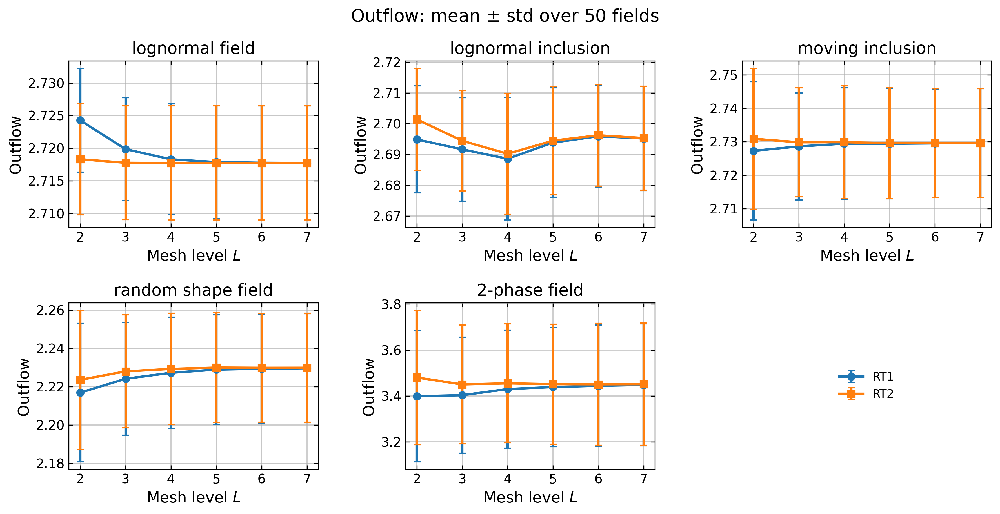

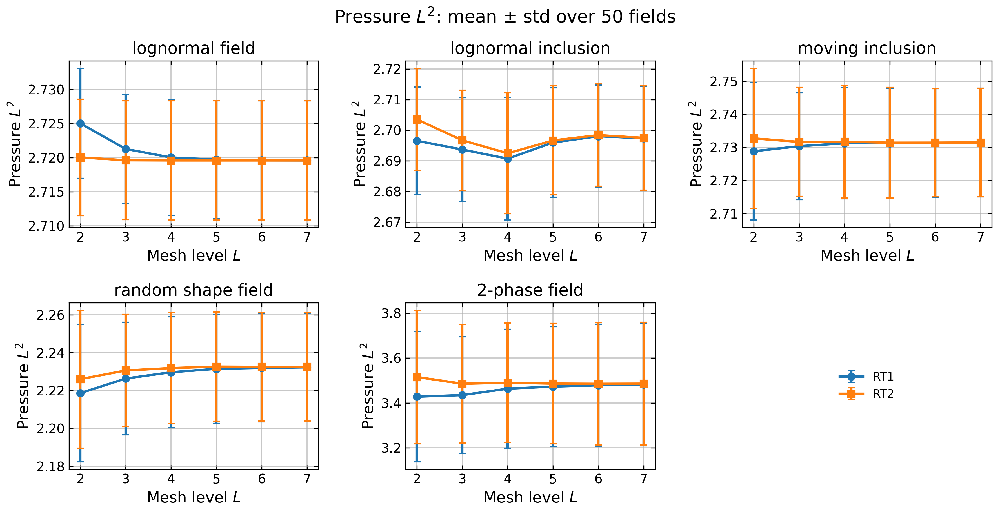

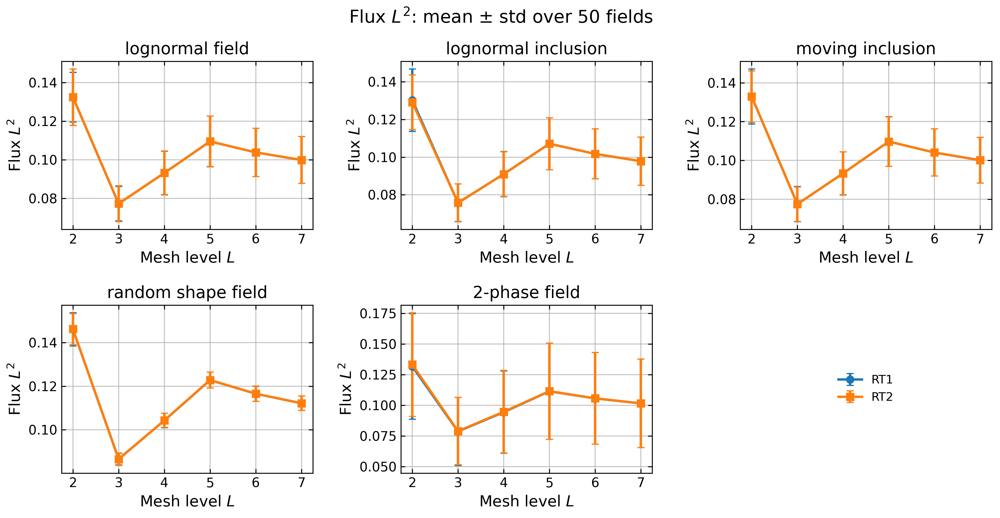

In [5]:
def plotDarcyQoiStyle(
    df_mean,
    qois_keep=("outflow", "pressure_L2", "flux_L2"),
    degrees=(1, 2),
    fields=fields,
):
    qoi_labels = {
        "outflow": "Outflow",
        "pressure_L2": r"Pressure $L^2$",
        "flux_L2": r"Flux $L^2$",
    }

    field_titles = {
        "LognormalField": "lognormal field",
        "LognormalInclusion": "lognormal inclusion",
        "LognormalMovingInclusion": "moving inclusion",
        "MultiphaseField": r"2-phase field",
        "RandomShapeField": "random shape field",
    }

    field_types = [
        "LognormalField",
        "LognormalInclusion",
        "LognormalMovingInclusion",
        "RandomShapeField",
        "MultiphaseField",
    ]

    degree_styles = {
        1: dict(color="C0", marker="o", linestyle="-"),
        2: dict(color="C1", marker="s", linestyle="-"),
    }

    for qoi in qois_keep:
        mean_col = f"{qoi}_mean"
        std_col = f"{qoi}_std"

        fig, axes = plt.subplots(
            2, 3,
            figsize=(12.0, 6.2),
            sharex=False,
            constrained_layout=False,
        )

        axes_flat = axes.ravel()
        plot_axes = axes_flat[:5]
        legend_ax = axes_flat[5]
        legend_ax.axis("off")

        for ax, field_type in zip(plot_axes, field_types):
            g = df_mean[df_mean["field_type"] == field_type].copy()

            for degree in degrees:
                gd = g[g["degree"] == degree].sort_values("mesh_level")

                if gd.empty:
                    continue

                ax.errorbar(
                    gd["mesh_level"],
                    gd[mean_col],
                    yerr=gd[std_col],
                    capsize=3,
                    label=rf"RT{degree}",
                    **degree_styles.get(degree, {}),
                )

            ax.set_title(field_titles.get(field_type, field_type))
            ax.set_xlabel(r"Mesh level $L$")
            ax.set_ylabel(qoi_labels.get(qoi, qoi))

            ax.grid(True, which="major", linewidth=0.9, alpha=0.7)
            ax.grid(True, which="minor", linewidth=0.6, alpha=0.35)

            ax.xaxis.set_major_locator(MaxNLocator(integer=True))
            ax.tick_params(which="both", direction="in", top=True, right=True)

        handles, labels = [], []
        for ax in plot_axes:
            h, l = ax.get_legend_handles_labels()
            for hi, li in zip(h, l):
                if li not in labels:
                    handles.append(hi)
                    labels.append(li)

        legend_ax.legend(
            handles,
            labels,
            loc="center",
            frameon=False,
        )

        fig.suptitle(
            rf"{qoi_labels.get(qoi, qoi)}: mean $\pm$ std over {nFields} fields",
            y=0.98,
        )

        fig.subplots_adjust(
            left=0.07,
            right=0.98,
            top=0.88,
            bottom=0.10,
            wspace=0.35,
            hspace=0.45,
        )

        plt.show()


plotDarcyQoiStyle(df_mean)

# Solution plots

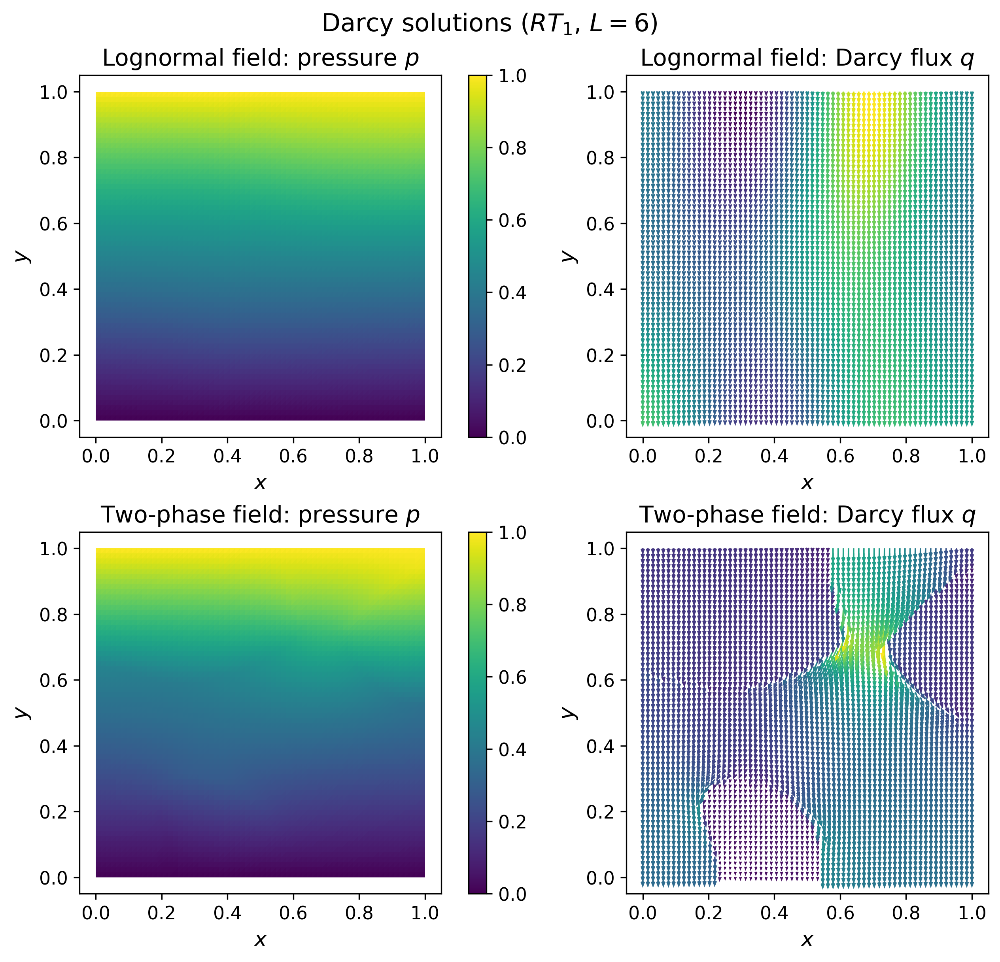

In [5]:
from fenics import *

plot_degree = 1
plot_level = 6
plot_seed = 10

field_types = [
    ("LognormalField", "Lognormal field"),
    ("MultiphaseField", "Two-phase field"),
]

xi_plot = sampleXi(plot_seed)
solutions = []

for field_type, field_label in field_types:
    field = make_field(field_type)

    darcy = Darcy(
        permeabilityField=field,
        meshLevel=plot_level,
        degree=plot_degree,
        elementType="RT",
        darcySolver="mumps",
        darcyPrecon=None,
        pTop=1.0,
        pBottom=0.0,
        plotSolution=False,
        femDarcyVerbose=False,
        linearSolverVerbose=False,
        estimateFemError=False,
    )

    darcy.solve(xi_plot)
    solutions.append((field_label, darcy))


fig, axes = plt.subplots(
    2,
    2,
    figsize=(10, 8),
    constrained_layout=True,
)

for row, (field_label, darcy) in enumerate(solutions):
    # Pressure
    plt.sca(axes[row, 0])
    pressure_plot = plot(
        darcy.p,
        cmap="viridis",
        vmin=0.0,
        vmax=1.0,
    )
    fig.colorbar(pressure_plot, ax=axes[row, 0])
    axes[row, 0].set_title(f"{field_label}: pressure $p$")
    axes[row, 0].set_xlabel("$x$")
    axes[row, 0].set_ylabel("$y$")
    axes[row, 0].set_aspect("equal")

    # Vector-valued flux: FEniCS produces a quiver plot
    plt.sca(axes[row, 1])
    quiver_plot = plot(
        darcy.q,
        scale=160,       # smaller value gives longer arrows
        width=0.004,    # arrow thickness
        headwidth=3,
        headlength=4,
        )
    axes[row, 1].set_title(f"{field_label}: Darcy flux $q$")
    axes[row, 1].set_xlabel("$x$")
    axes[row, 1].set_ylabel("$y$")
    axes[row, 1].set_aspect("equal")

fig.suptitle(
    rf"Darcy solutions ($RT_{plot_degree}$, $L={plot_level}$)"
)

plt.show()

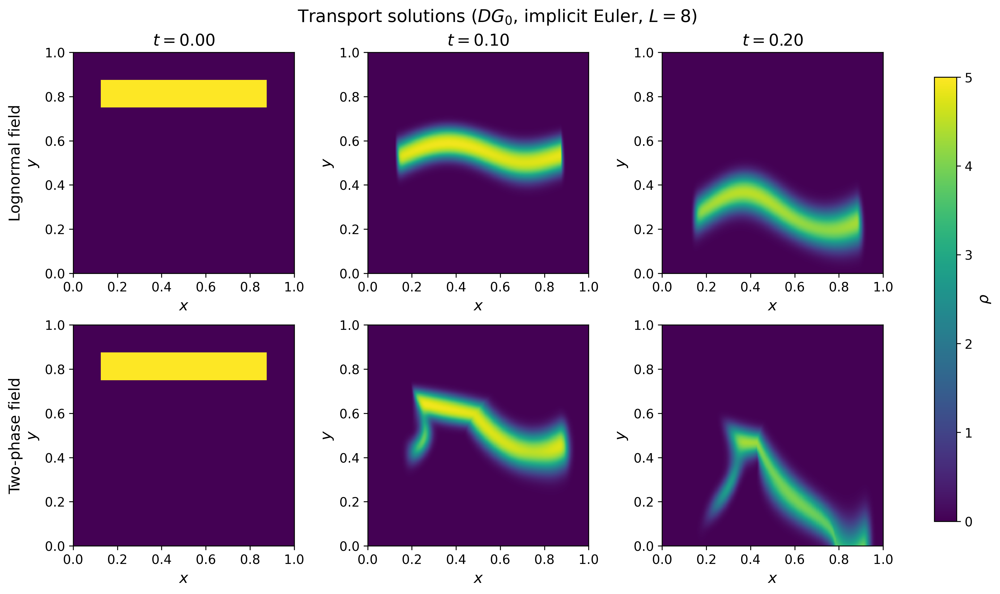

In [ ]:
from fenics import Constant, plot
from fem.transportProblem import Transport
qoi_box = (
    (0.375, 0.625),  
    (0.000, 0.250),  
)
c0 = Expression(
    """
    x[0] >= x_left &&
    x[0] <= x_right &&
    x[1] >= y_bottom &&
    x[1] <= y_top
    ? c_value : 0.0
    """,
    degree=0,
    x_left=0.125,
    x_right=0.875,
    y_bottom=0.75,
    y_top=0.875,
    c_value=5.0,
)

plot_level = 8
plot_degree = 0
plot_times = [0.0, 0.1, 0.2]
plot_sample_id = 0

plot_n_steps = 4 * 2**plot_level

field_types = [
    ("LognormalField", "Lognormal field"),
    ("MultiphaseField", "Two-phase field"),
]

# Use the same stochastic coordinates for both field types.
xi_plot = sampleXi(plot_sample_id)

transport_solutions = []

for field_type, field_label in field_types:
    transport = Transport(
        permeabilityField=make_field(field_type),

        # DG0 transport on level 6
        meshLevelTransport=plot_level,
        degreeTransport=plot_degree,
        elementTypeTransport="DG",

        # RT1 Darcy problem on the same mesh
        meshLevelDarcy=plot_level,
        degreeDarcy=plot_degree + 1,
        elementTypeDarcy="RT",

        transportSolver="gmres",
        transportPrecon="ilu",

        darcySolver="mumps",
        darcyPrecon=None,

        cInflow=Constant(0.0),
        c0=c0,

        # Implicit Euler
        theta=1.0,
        T=0.5,
        nSteps=plot_n_steps,
        adaptCfl=False,

        qoiBox=qoi_box,

        relTol=1e-10,
        absTol=1e-12,
        maxIter=3000,

        plotSolution=False,
        storeSolutionHistory=True,

        linearSolverVerbose=False,
        femTransportVerbose=False,
        femDarcyVerbose=False,
    )

    transport.solve(xi_plot)

    time_values = np.asarray(transport.timeHistory)

    snapshot_ids = [
        int(np.argmin(np.abs(time_values - target_time)))
        for target_time in plot_times
    ]

    transport_solutions.append(
        (field_label, transport, snapshot_ids)
    )



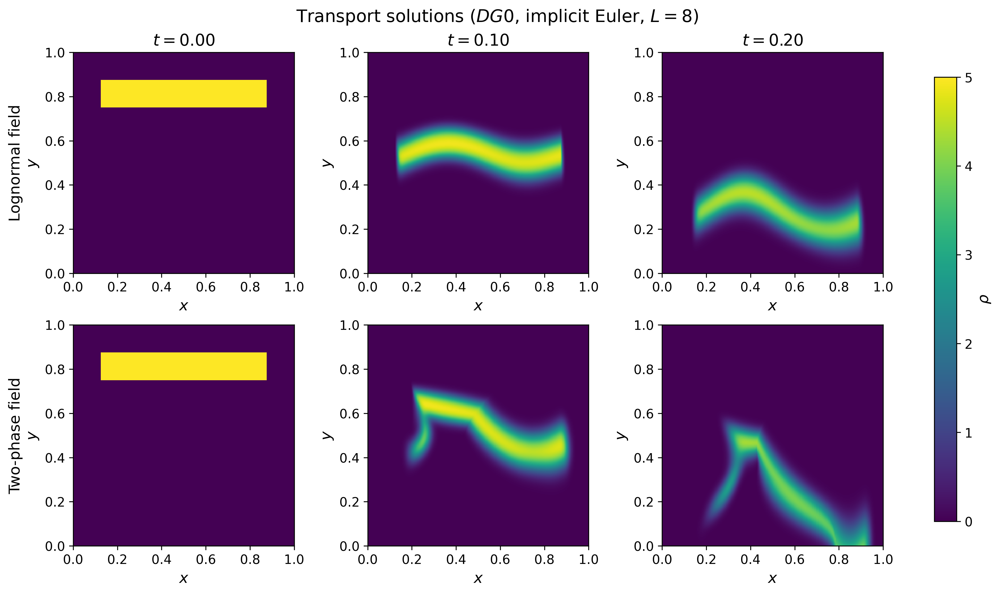

In [29]:

fig, axes = plt.subplots(
    2,
    3,
    figsize=(12, 7),
    constrained_layout=True,
)

concentration_plot = None

for row, (field_label, transport, snapshot_ids) in enumerate(
    transport_solutions
):
    for column, (target_time, snapshot_id) in enumerate(
        zip(plot_times, snapshot_ids)
    ):
        ax = axes[row, column]
        plt.sca(ax)

        concentration = transport.solutionHistory[snapshot_id]
        actual_time = transport.timeHistory[snapshot_id]

        concentration_plot = plot(
            concentration,
            cmap="viridis",
            vmin=0.0,
            vmax=5.0,
        )

        if row == 0:
            ax.set_title(rf"$t={actual_time:.2f}$")

        ax.set_xlabel("$x$")
        ax.set_aspect("equal")
        ax.set_xlim(0.0, 1.0)
        ax.set_ylim(0.0, 1.0)

        if column == 0:
            ax.set_ylabel(f"{field_label}\n$y$")
        else:
            ax.set_ylabel("$y$")


fig.suptitle(
    r"Transport solutions "
    rf"($DG0$, implicit Euler, $L={plot_level}$)"
)

fig.colorbar(
    concentration_plot,
    ax=axes,
    label=r"$\rho$",
    shrink=0.9,
)

plt.show()

## MC vs. SC

In [9]:
degreeRT = 1
meshLevel=5
stochDim = 15

data_file = (
    PROJECT_ROOT
    / "configs"
    / "pklData"
    / f"DarcyUQDim{stochDim}RT{degreeRT}L{meshLevel}.pkl"
)

data = pd.read_pickle(data_file)


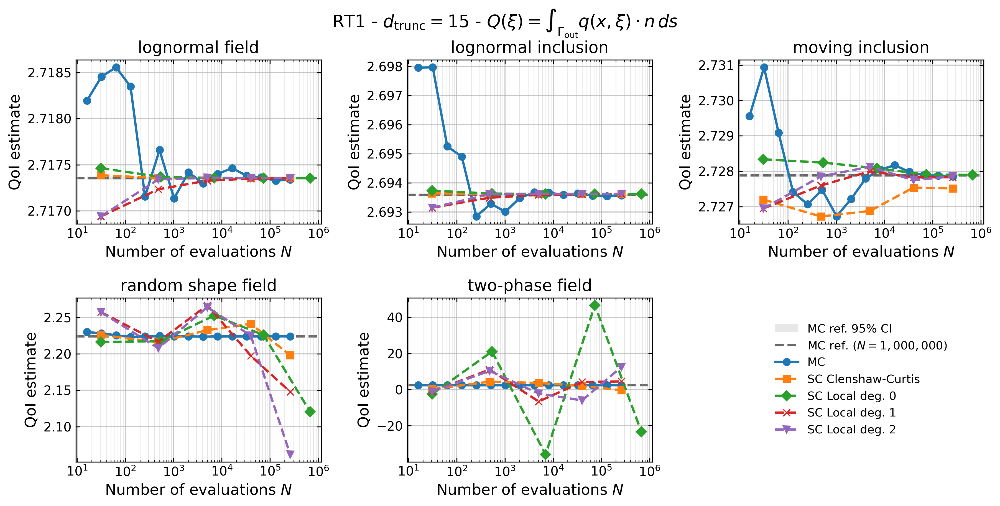

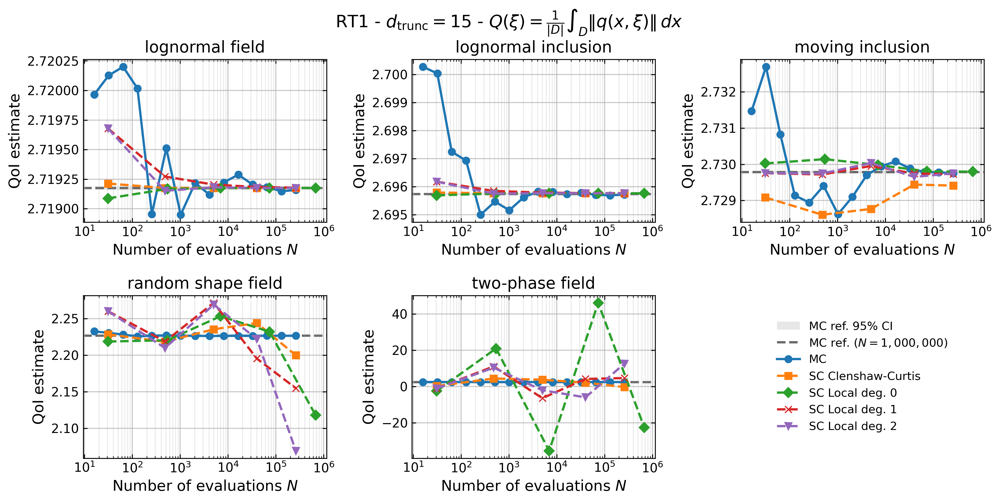

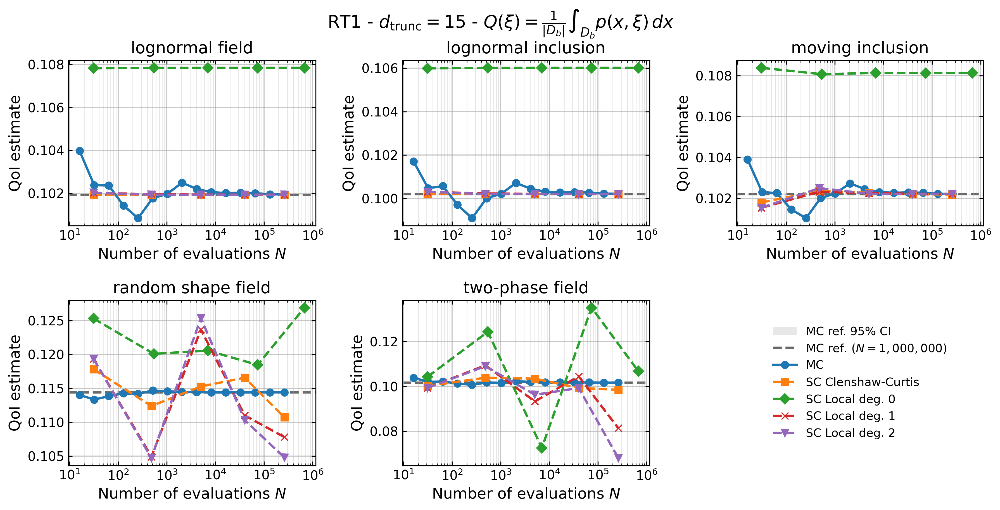

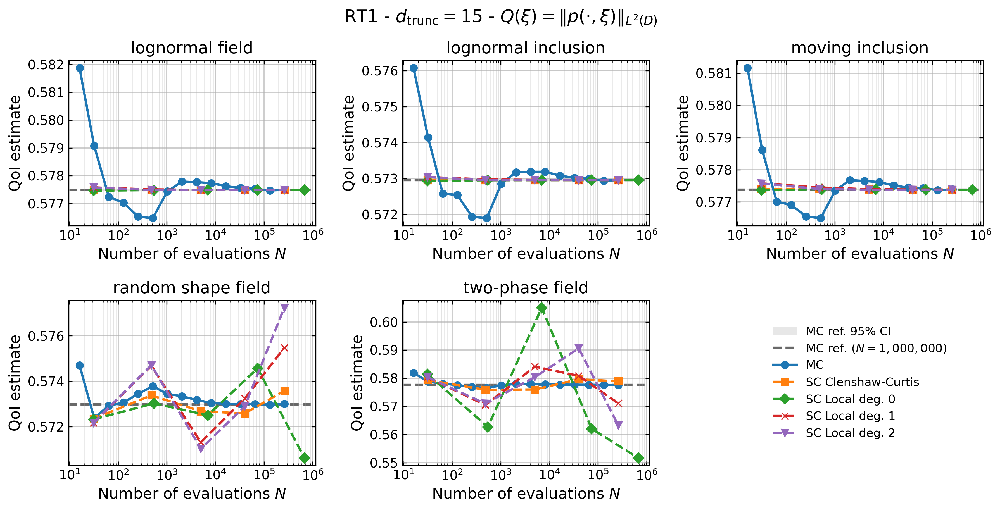

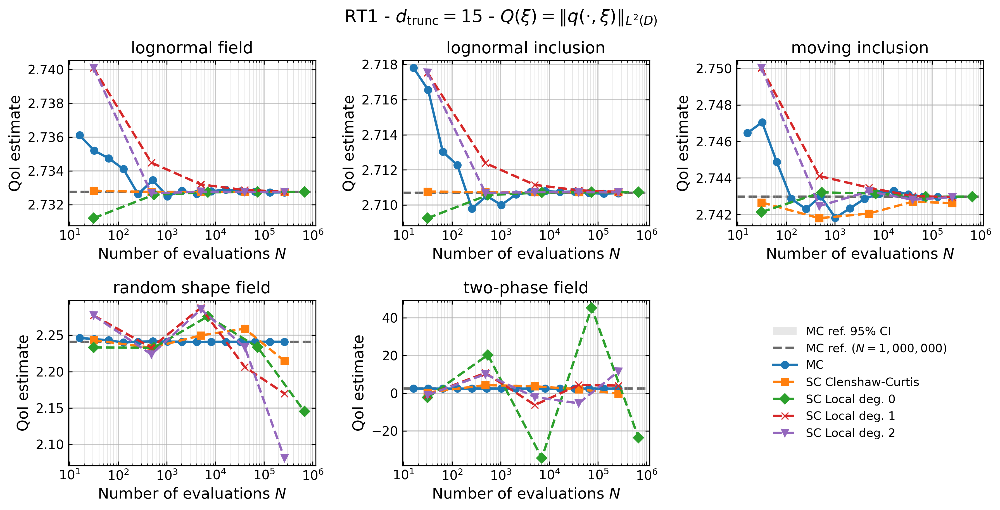

In [10]:
def plotMcSc(
    df,
    df_ref,
    qois_keep=None,
    qoi_latex=None,
    degreeRT=degreeRT,
    methods=("MC", "SCClenshawCurtis", "SCLocalDegree0", "SCLocalDegree1", "SCLocalDegree2"),
    stochDim=stochDim,
):
    if qois_keep is None:
        qois_keep = list(df["qoi"].drop_duplicates())

    if qoi_latex is None:
        qoi_latex = {qoi: qoi for qoi in qois_keep}

    method_labels = {
        "MC": "MC",
        "SCClenshawCurtis": "SC Clenshaw-Curtis",
        "SCLocalDegree0": "SC Local deg. 0",
        "SCLocalDegree1": "SC Local deg. 1",
        "SCLocalDegree2": "SC Local deg. 2",
    }

    method_styles = {
        "MC": dict(color="C0", marker="o", linestyle="-"),
        "SCClenshawCurtis": dict(color="C1", marker="s", linestyle="--"),
        "SCLocalDegree0": dict(color="C2", marker="D", linestyle="--"),
        "SCLocalDegree1": dict(color="C3", marker="x", linestyle="--"),
        "SCLocalDegree2": dict(color="C4", marker="v", linestyle="--"),
    }

    field_titles = {
        "LognormalField": "lognormal field",
        "LognormalInclusion": "lognormal inclusion",
        "LognormalMovingInclusion": "moving inclusion",
        "MultiphaseField": r"two-phase field",
        "RandomShapeField": "random shape field",
    }

    field_types = [
        "LognormalField",
        "LognormalInclusion",
        "LognormalMovingInclusion",
        "RandomShapeField",
        "MultiphaseField"
    ]

    for qoi in qois_keep:
        fig, axes = plt.subplots(
            2, 3,
            figsize=(12.0, 6.2),
            sharex=False,
            constrained_layout=False,
        )

        axes_flat = axes.ravel()
        plot_axes = axes_flat[:5]
        legend_ax = axes_flat[5]
        legend_ax.axis("off")

        for ax, fieldType in zip(plot_axes, field_types):

            # MC reference stochastic error (= sqrt(estimator variance))
            g_ref = df_ref[
                (df_ref["fieldType"] == fieldType)
                & (df_ref["degree"] == degreeRT)
                & (df_ref["qoi"] == qoi)
            ]
            ref_error = g_ref["stochasticError"].iloc[0]

            g = df[
                (df["fieldType"] == fieldType)
                & (df["degree"] == degreeRT)
                & (df["qoi"] == qoi)
                & (df["method"].isin(methods))
            ].copy()

            ref_g = df_ref[
                (df_ref["fieldType"] == fieldType)
                & (df_ref["degree"] == degreeRT)
                & (df_ref["qoi"] == qoi)
            ].copy()

            if ref_g.empty:
                print(f"Warning: no reference for {fieldType} / {qoi}")
            else:
                ref_row = ref_g.iloc[0]
                ref_mean = ref_row["mean"]
                ref_N = int(ref_row["N"])

                ref_err = None
                if (
                    "stochasticError" in ref_row.index
                    and np.isfinite(ref_row["stochasticError"])
                ):
                    ref_err = 1.96 * ref_row["stochasticError"]

                if not g.empty:
                    x_min = g["N"].min()
                    x_max = g["N"].max()
                else:
                    x_min = ref_N
                    x_max = ref_N

                if ref_err is not None:
                    ax.fill_between(
                        [x_min, x_max],
                        [ref_mean - ref_err, ref_mean - ref_err],
                        [ref_mean + ref_err, ref_mean + ref_err],
                        color="0.35",
                        alpha=0.14,
                        linewidth=0.0,
                        label="MC ref. 95% CI",
                        zorder=0,
                    )

                ax.axhline(
                    ref_mean,
                    color="0.35",
                    linestyle="--",
                    linewidth=2.0,
                    alpha=0.9,
                    label=rf"MC ref. ($N={ref_N:,}$)",
                    zorder=1,
                )

            for method in methods:
                gm = g[g["method"] == method].sort_values("N")

                if gm.empty:
                    continue

                ax.semilogx(
                    gm["N"],
                    gm["mean"],
                    label=method_labels.get(method, method),
                    **method_styles.get(method, {}),
                    zorder=2,
                )

            

            ax.set_title(field_titles.get(fieldType, fieldType))
            ax.set_xlabel(r"Number of evaluations $N$")
            ax.set_ylabel(r"QoI estimate")

            ax.grid(True, which="major", linewidth=0.9, alpha=0.7)
            ax.grid(True, which="minor", linewidth=0.6, alpha=0.35)

            ax.xaxis.set_major_locator(LogLocator(base=10))
            ax.xaxis.set_minor_formatter(NullFormatter())

            ax.tick_params(which="both", direction="in", top=True, right=True)

        handles, labels = [], []
        for ax in plot_axes:
            h, l = ax.get_legend_handles_labels()
            for hi, li in zip(h, l):
                if li not in labels:
                    handles.append(hi)
                    labels.append(li)

        legend_ax.legend(
            handles,
            labels,
            loc="center",
            frameon=False,
        )

        fig.suptitle(
            rf"RT{degreeRT} - $d_{{\mathrm{{trunc}}}}={stochDim}$ - "
            rf"{qoi_latex.get(qoi, qoi)}",
            y=0.98,
        )

        fig.subplots_adjust(
            left=0.07,
            right=0.98,
            top=0.88,
            bottom=0.10,
            wspace=0.35,
            hspace=0.45,
        )

        plt.show()

plotMcSc(
    df=data["df"],
    df_ref=data["df_ref"],
    degreeRT=1,
    stochDim=data["settings"]["stochDim"],
    qoi_latex=qoi_latex
)

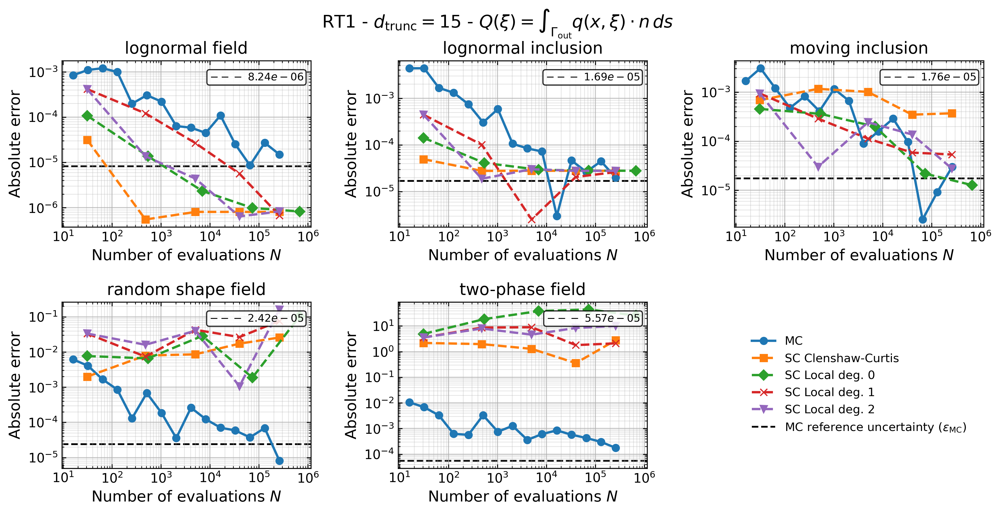

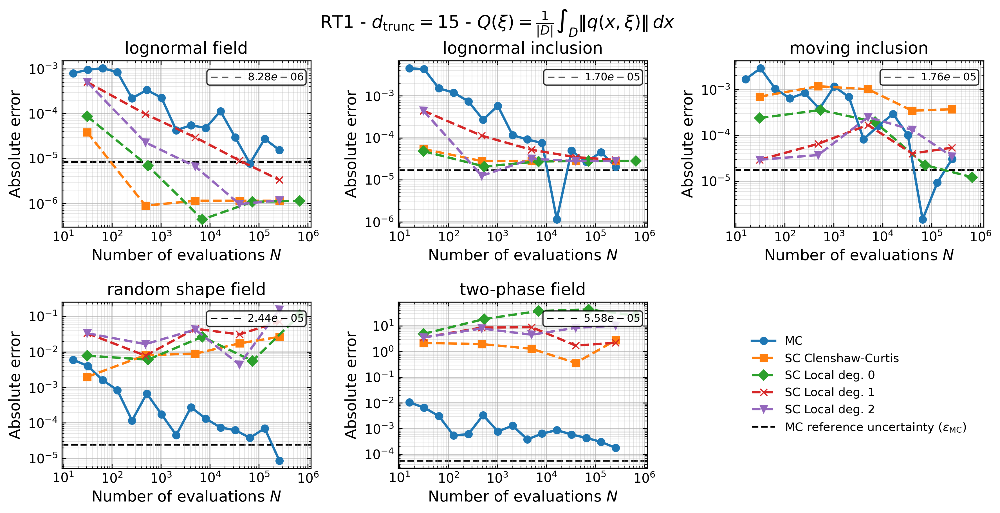

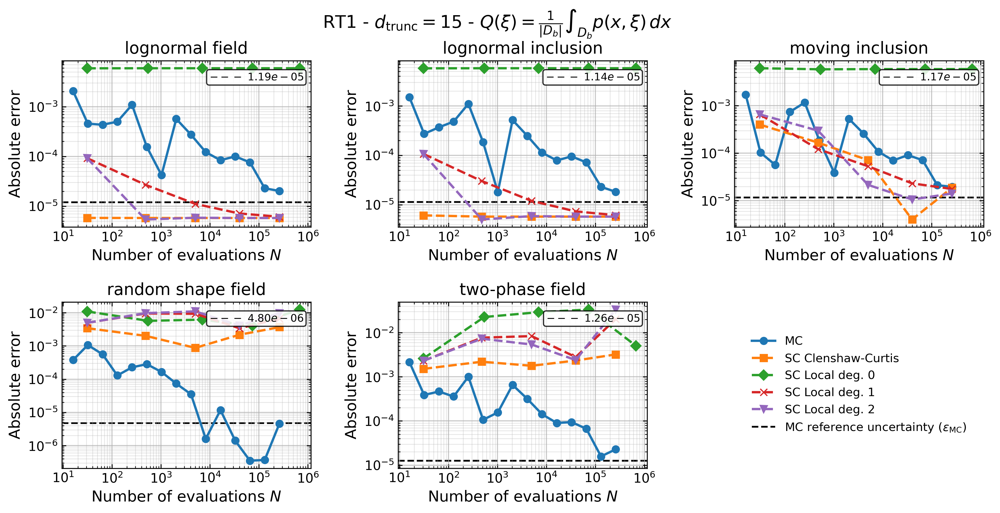

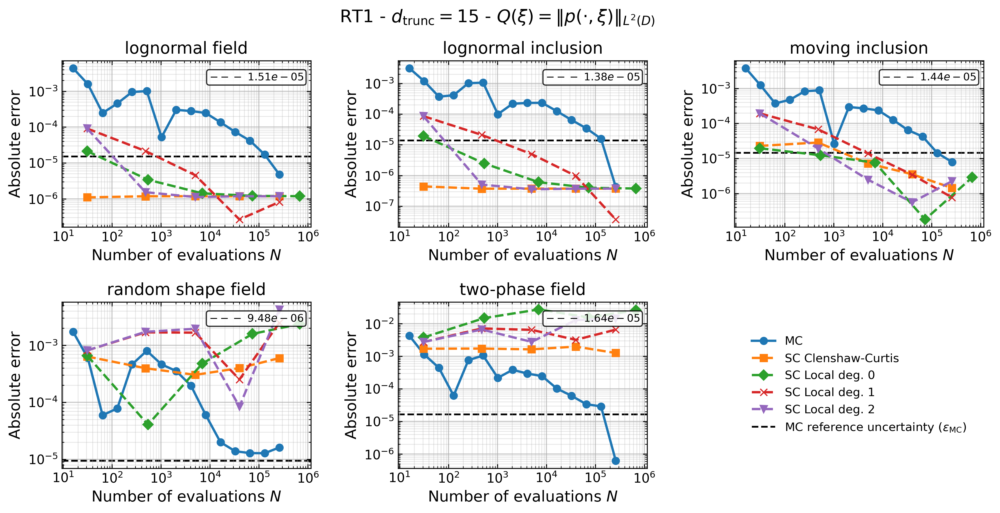

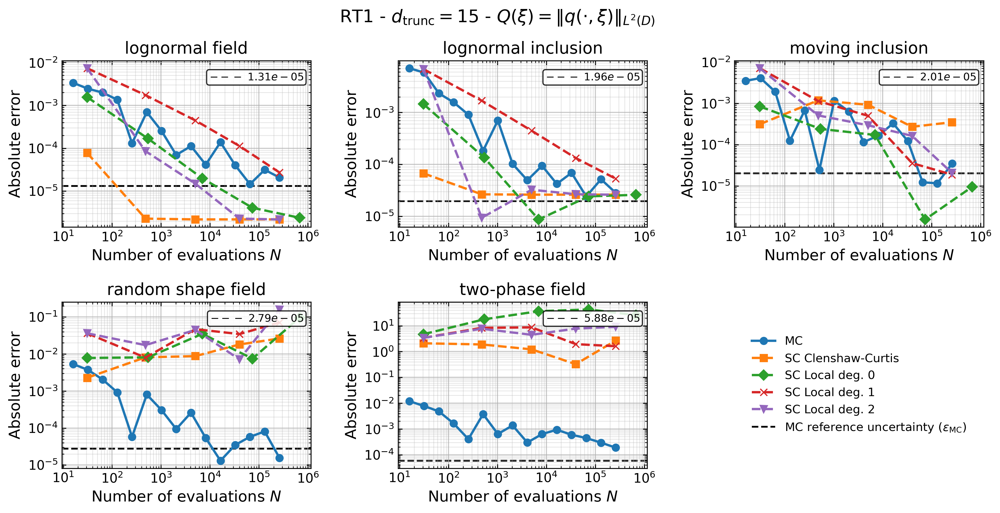

In [11]:
from matplotlib.lines import Line2D
def plotMcScAbsError(
    df,
    df_ref,
    qois_keep=None,
    qoi_latex=qoi_latex,
    degreeRT=degreeRT,
    methods=("MC", "SCClenshawCurtis", "SCLocalDegree0", "SCLocalDegree1", "SCLocalDegree2"),
    stochDim=stochDim,
):
    if qois_keep is None:
        qois_keep = list(df["qoi"].drop_duplicates())

    if qoi_latex is None:
        qoi_latex = {qoi: qoi for qoi in qois_keep}

    method_labels = {
        "MC": "MC",
        "SCClenshawCurtis": "SC Clenshaw-Curtis",
        "SCLocalDegree0": "SC Local deg. 0",
        "SCLocalDegree1": "SC Local deg. 1",
        "SCLocalDegree2": "SC Local deg. 2",
    }

    method_styles = {
        "MC": dict(color="C0", marker="o", linestyle="-"),
        "SCClenshawCurtis": dict(color="C1", marker="s", linestyle="--"),
        "SCLocalDegree0": dict(color="C2", marker="D", linestyle="--"),
        "SCLocalDegree1": dict(color="C3", marker="x", linestyle="--"),
        "SCLocalDegree2": dict(color="C4", marker="v", linestyle="--"),
    }

    field_titles = {
        "LognormalField": "lognormal field",
        "LognormalInclusion": "lognormal inclusion",
        "LognormalMovingInclusion": "moving inclusion",
        "MultiphaseField": r"two-phase field",
        "RandomShapeField": "random shape field",
    }

    field_types = [
        "LognormalField",
        "LognormalInclusion",
        "LognormalMovingInclusion",
        "RandomShapeField",
        "MultiphaseField",
    ]

    for qoi in qois_keep:
        fig, axes = plt.subplots(
            2, 3,
            figsize=(12.0, 6.2),
            sharex=False,
            constrained_layout=False,
        )

        axes_flat = axes.ravel()
        plot_axes = axes_flat[:5]
        legend_ax = axes_flat[5]
        legend_ax.axis("off")

        for ax, fieldType in zip(plot_axes, field_types):
            g = df[
                (df["fieldType"] == fieldType)
                & (df["degree"] == degreeRT)
                & (df["qoi"] == qoi)
                & (df["method"].isin(methods))
            ].copy()

            if g.empty:
                print(f"Warning: no data for {fieldType} / {qoi}")
                continue

            # MC reference stochastic error from df_ref
            g_ref = df_ref[
                (df_ref["fieldType"] == fieldType)
                & (df_ref["degree"] == degreeRT)
                & (df_ref["qoi"] == qoi)
            ]

            if not g_ref.empty:
                ref_error = g_ref["stochasticError"].iloc[0]

                if np.isfinite(ref_error) and ref_error > 0:
                    ax.axhline(
                        ref_error,
                        color="k",
                        linestyle="--",
                        linewidth=1.5,
                        zorder=1,
                    )

                    ax.text(
                        0.97,
                        0.93,
                        rf"$---\ {ref_error:.2e}$",
                        transform=ax.transAxes,
                        ha="right",
                        va="top",
                        fontsize=9,
                        bbox=dict(
                            boxstyle="round,pad=0.25",
                            facecolor="white",
                            edgecolor="black",
                            alpha=0.85,
                        ),
                    )

            for method in methods:
                gm = g[g["method"] == method].sort_values("N").copy()

                if gm.empty:
                    continue

                gm = gm[
                    np.isfinite(gm["absError"])
                    & (gm["absError"] > 0.0)
                    & np.isfinite(gm["N"])
                    & (gm["N"] > 0)
                ]

                if gm.empty:
                    continue

                ax.loglog(
                    gm["N"],
                    gm["absError"],
                    label=method_labels.get(method, method),
                    **method_styles.get(method, {}),
                    zorder=2,
                )
            

            ax.set_title(field_titles.get(fieldType, fieldType))
            ax.set_xlabel(r"Number of evaluations $N$")
            ax.set_ylabel(r"Absolute error")

            ax.grid(True, which="major", linewidth=0.9, alpha=0.7)
            ax.grid(True, which="minor", linewidth=0.6, alpha=0.35)

            ax.xaxis.set_major_locator(LogLocator(base=10))
            ax.xaxis.set_minor_formatter(NullFormatter())

            ax.tick_params(which="both", direction="in", top=True, right=True)

        handles, labels = [], []
        for ax in plot_axes:
            h, l = ax.get_legend_handles_labels()
            for hi, li in zip(h, l):
                if li not in labels:
                    handles.append(hi)
                    labels.append(li)
        
        handles.append(
            Line2D(
                [0], [0],
                color="k",
                linestyle="--",
                linewidth=1.5,
            )
        )
        labels.append(r"MC reference uncertainty ($\epsilon_{\text{MC}}$)")

        legend_ax.legend(
            handles,
            labels,
            loc="center",
            frameon=False,
        )

        fig.suptitle(
            rf"RT{degreeRT} - $d_{{\mathrm{{trunc}}}}={stochDim}$ - "
            rf"{qoi_latex.get(qoi, qoi)}",
            y=0.98,
        )

        fig.subplots_adjust(
            left=0.07,
            right=0.98,
            top=0.88,
            bottom=0.10,
            wspace=0.35,
            hspace=0.45,
        )

        plt.show()


plotMcScAbsError(
    df=data["df"],
    df_ref=data["df_ref"],
    degreeRT=1,
    stochDim=data["settings"]["stochDim"],
    qoi_latex=qoi_latex,
)

## Timing Analysis

In [12]:
import numpy as np
import pandas as pd
from pathlib import Path



df = data["df"].copy()
df_ref = data["df_ref"].copy()

# --- Settings ---
qois_to_report = ["Outflow", "Pressure L²", "Flux L²"]

field_labels = {
    "LognormalField": "Lognormal",
    "LognormalInclusion": "Lognormal inclusion",
    "LognormalMovingInclusion": "Moving inclusion",
    "RandomShapeField": "Random shape",
    "MultiphaseField": "Two-phase",
}

method_labels = {
    "MC": "MC",
    "SCClenshawCurtis": "CC-SC",
    "SCLocalDegree0": "Local SC p=0",
    "SCLocalDegree1": "Local SC p=1",
    "SCLocalDegree2": "Local SC p=2",
}

field_order = [
    "Lognormal",
    "Lognormal inclusion",
    "Moving inclusion",
    "Random shape",
    "Two-phase",
]

method_order = [
    "MC",
    "CC-SC",
    "Local SC p=0",
    "Local SC p=1",
    "Local SC p=2",
]

# --- Reference uncertainty ---
ref = df_ref[
    ["fieldType", "degree", "qoi", "mean", "stochasticError"]
].rename(columns={
    "mean": "reference_mean",
    "stochasticError": "reference_uncertainty",
})

work = df.merge(ref, on=["fieldType", "degree", "qoi"], how="left")

work["evaluations"] = work["N"]

work["runtime_s"] = np.where(
    work["method"].eq("MC"),
    work["runtime"],
    work["costPerSample"] * work["evaluations"],
)

work["inside_threshold"] = (
    np.isfinite(work["absError"])
    & np.isfinite(work["reference_uncertainty"])
    & (work["absError"] <= work["reference_uncertainty"])
)

# --- Find first point after which method remains below threshold ---
rows = []

group_cols = ["fieldType", "degree", "qoi", "method"]

for keys, g in (
    work.sort_values(group_cols + ["evaluations"])
        .groupby(group_cols)
):
    g = g.reset_index(drop=True)

    g["inside_forever"] = (
        g["inside_threshold"][::-1]
        .cummin()
        [::-1]
        .astype(bool)
    )

    hit = g[g["inside_forever"]]

    if hit.empty:
        continue

    first = hit.iloc[0]

    rows.append({
        **dict(zip(group_cols, keys)),
        "Field": field_labels.get(keys[0], keys[0]),
        "Method": method_labels.get(keys[3], keys[3]),
        "Evaluations": int(first["evaluations"]),
        "Total runtime [s]": float(first["runtime_s"]),
    })

summary = pd.DataFrame(rows)

summary["Field"] = pd.Categorical(
    summary["Field"],
    categories=field_order,
    ordered=True,
)

summary["Method"] = pd.Categorical(
    summary["Method"],
    categories=method_order,
    ordered=True,
)

summary = summary.sort_values(["qoi", "Field", "Method"])

summary["Total runtime [s]"] = summary["Total runtime [s]"].round(2)

# --- Print one table per QoI ---
for qoi in qois_to_report:
    table = summary[summary["qoi"].eq(qoi)][
        ["Field", "Method", "Evaluations", "Total runtime [s]"]
    ].copy()

    print("\n" + "=" * 80)
    print(f"{qoi}: methods that reached the MC reference uncertainty threshold")
    print("=" * 80)

    print(table.to_string(index=False))


Outflow: methods that reached the MC reference uncertainty threshold
           Field       Method  Evaluations  Total runtime [s]
       Lognormal        CC-SC          481            1557.83
       Lognormal Local SC p=0         6971            4391.91
       Lognormal Local SC p=1        40001            1527.47
       Lognormal Local SC p=2         5021            1528.51
Moving inclusion Local SC p=0       676247            4308.99
    Random shape           MC       262144            5810.60

Pressure L²: methods that reached the MC reference uncertainty threshold
              Field       Method  Evaluations  Total runtime [s]
          Lognormal           MC       262144            5778.31
          Lognormal        CC-SC           31            1557.83
          Lognormal Local SC p=0          541            4391.91
          Lognormal Local SC p=1         5021            1527.47
          Lognormal Local SC p=2          481            1528.51
Lognormal inclusion           MC

## Multiphase and Stochastic Dimension

In [14]:
degreeRT = 1
meshLevel = 4

multiphase_file = (
    PROJECT_ROOT
    / "configs"
    / "pklData"
    / f"DarcyUQMutliphaseDimRT{degreeRT}L{meshLevel}.pkl"
)


multiphaseData = pd.read_pickle(multiphase_file)

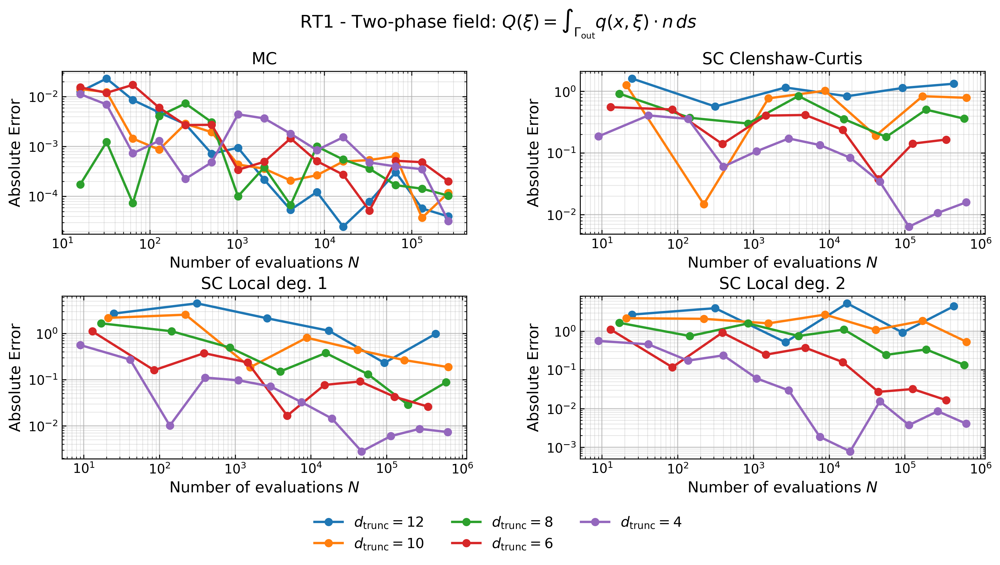

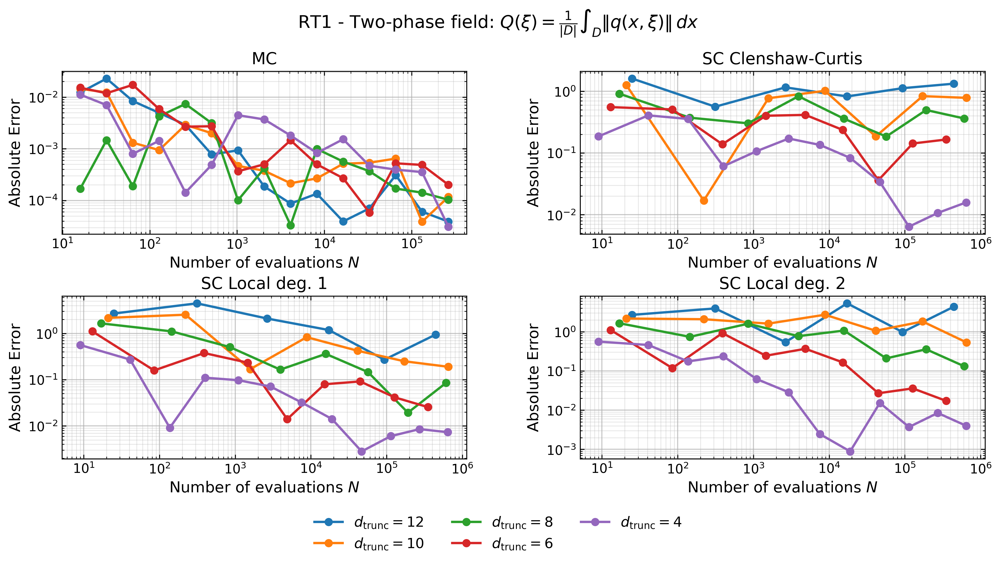

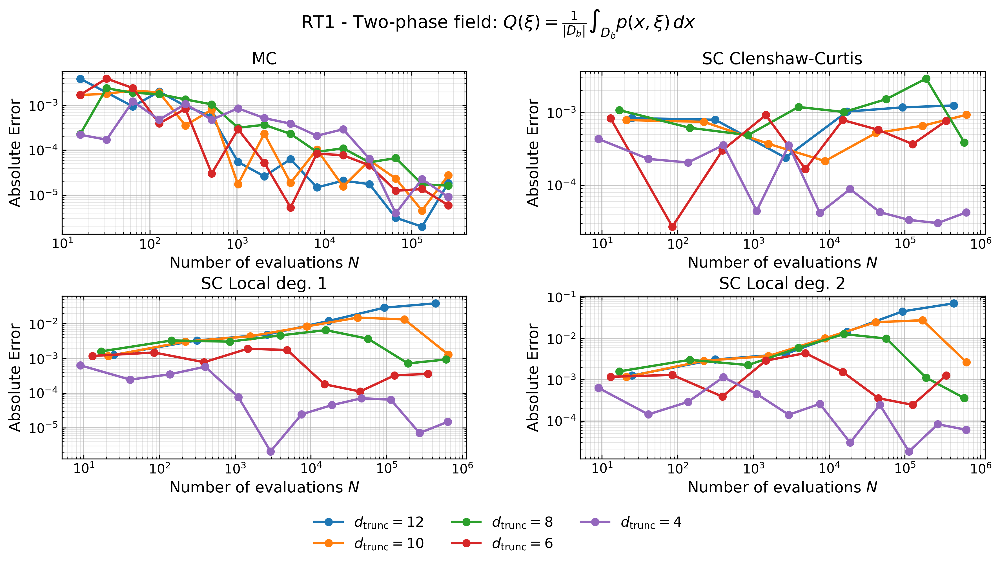

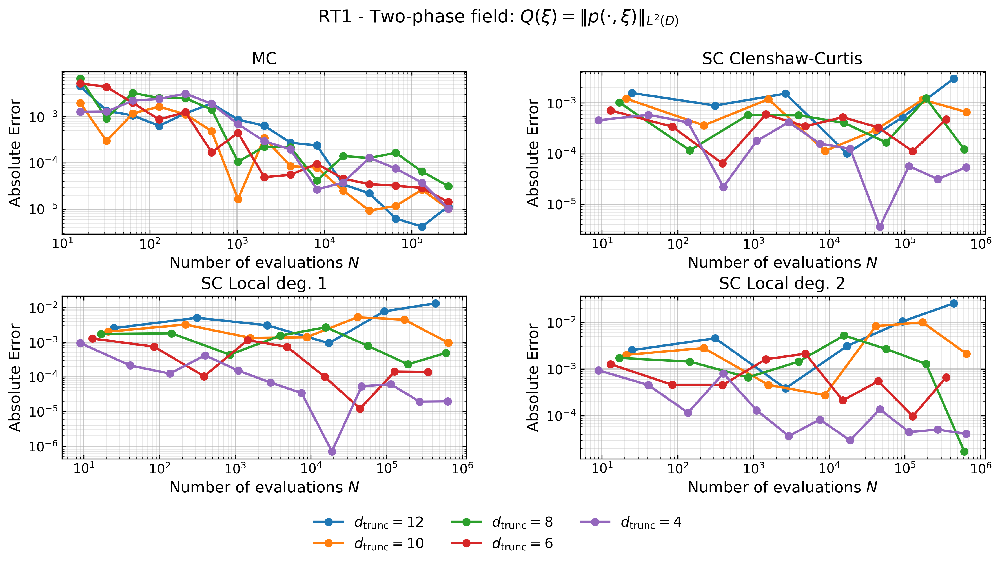

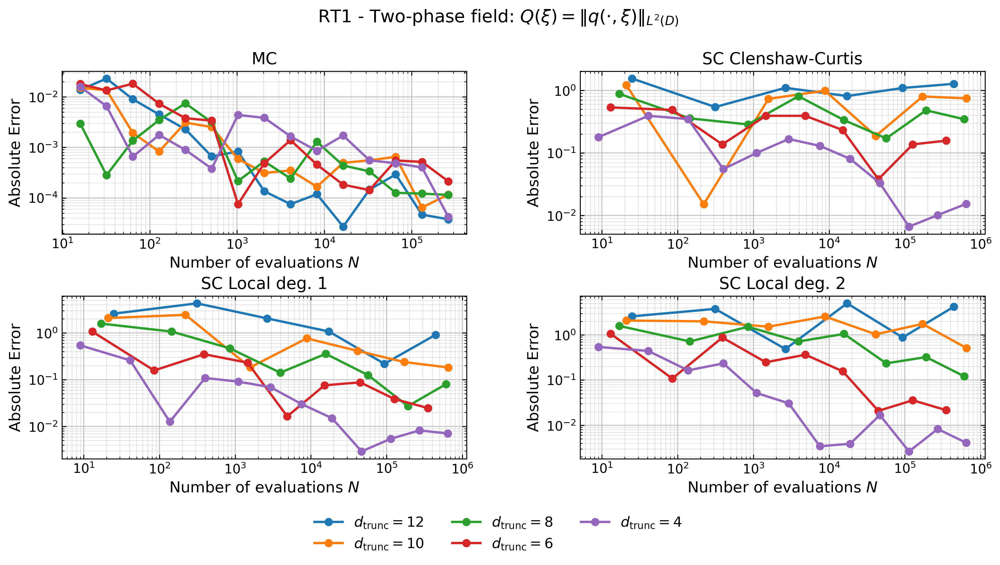

In [15]:
def plotMcScAbsErrorByDim(
    df,
    qois_keep=None,
    qoi_latex=qoi_latex,
    degreeRT=1,
    methods=("MC", "SCClenshawCurtis", "SCLocalDegree1", "SCLocalDegree2"),
    dims=None,
):
    if qois_keep is None:
        qois_keep = list(df["qoi"].drop_duplicates())

    if qoi_latex is None:
        qoi_latex = {qoi: qoi for qoi in qois_keep}

    if dims is None:
        dims = sorted(df["fieldCase"].dropna().unique(), reverse=True)

    method_labels = {
        "MC": "MC",
        "SCClenshawCurtis": "SC Clenshaw-Curtis",
        "SCLocalDegree1": "SC Local deg. 1",
        "SCLocalDegree2": "SC Local deg. 2",
    }

    fig_method_order = list(methods)

    for qoi in qois_keep:
        fig, axes = plt.subplots(
            2, 2,
            #figsize=(8.2, 6.4),
            figsize=(12.0, 6.2),
            sharex=False,
            sharey=False,
            constrained_layout=False,
        )

        axes = axes.ravel()

        for ax, method in zip(axes, fig_method_order):
            g = df[
                (df["degree"] == degreeRT)
                & (df["qoi"] == qoi)
                & (df["method"] == method)
                & (df["fieldCase"].isin(dims))
            ].copy()

            if g.empty:
                ax.set_title(method_labels.get(method, method))
                ax.text(0.5, 0.5, "no data", ha="center", va="center",
                        transform=ax.transAxes)
                continue

            for dim in dims:
                gd = g[g["fieldCase"] == dim].sort_values("N").copy()

                gd = gd[
                    np.isfinite(gd["N"])
                    & (gd["N"] > 0)
                    & np.isfinite(gd["absError"])
                    & (gd["absError"] > 0.0)
                ]

                if gd.empty:
                    continue

                ax.loglog(
                    gd["N"],
                    gd["absError"],
                    marker="o",
                    linestyle="-",
                    label=rf"$d_{{\text{{trunc}}}}={int(dim)}$",
                    zorder=2,
                )

            ax.set_title(method_labels.get(method, method))
            ax.set_xlabel(r"Number of evaluations $N$")
            ax.set_ylabel(r"Absolute Error")

            ax.grid(True, which="major", linewidth=0.9, alpha=0.7)
            ax.grid(True, which="minor", linewidth=0.6, alpha=0.35)

            ax.xaxis.set_major_locator(LogLocator(base=10))
            ax.xaxis.set_minor_formatter(NullFormatter())
            ax.tick_params(which="both", direction="in", top=True, right=True)

        handles, labels = [], []
        for ax in axes:
            h, l = ax.get_legend_handles_labels()
            for hi, li in zip(h, l):
                if li not in labels:
                    handles.append(hi)
                    labels.append(li)

        fig.legend(
            handles,
            labels,
            loc="lower center",
            ncol=min(3, len(labels)),
            frameon=False,
            bbox_to_anchor=(0.5, -0.06),
            fontsize=12
        )

        fig.suptitle(
            rf"RT{degreeRT} - Two-phase field: {qoi_latex.get(qoi, qoi)}",
            y=1.0,
        )

        fig.subplots_adjust(
            left=0.07,
            right=0.98,
            top=0.88,
            bottom=0.14,
            wspace=0.28,
            hspace=0.38,
        )

        plt.show()

plotMcScAbsErrorByDim(
    df=multiphaseData["df"],
    degreeRT=1,
    qoi_latex=qoi_latex,
)